## SF crime data analysis and modeling

### In this notebook, I performed big data analysis on SF crime data using big data techniques (OLAP). (https://data.sfgov.org/Public-Safety/Police-Department-Incident-Reports-Historical-2003/tmnf-yvry). Unsupervised learning and time series are used to model and analyze the data in time and space.

In [0]:
from csv import reader
from pyspark.sql import Row 
from pyspark.sql import SparkSession
from pyspark.sql.types import *
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import warnings

import os
os.environ["PYSPARK_PYTHON"] = "python3"


In [0]:
import urllib.request
urllib.request.urlretrieve("https://data.sfgov.org/resource/wg3w-h783.csv?$query=SELECT%0A%20%20%60incident_datetime%60%2C%0A%20%20%60incident_date%60%2C%0A%20%20%60incident_time%60%2C%0A%20%20%60incident_year%60%2C%0A%20%20%60incident_day_of_week%60%2C%0A%20%20%60report_datetime%60%2C%0A%20%20%60row_id%60%2C%0A%20%20%60incident_id%60%2C%0A%20%20%60incident_number%60%2C%0A%20%20%60cad_number%60%2C%0A%20%20%60report_type_code%60%2C%0A%20%20%60report_type_description%60%2C%0A%20%20%60filed_online%60%2C%0A%20%20%60incident_code%60%2C%0A%20%20%60incident_category%60%2C%0A%20%20%60incident_subcategory%60%2C%0A%20%20%60incident_description%60%2C%0A%20%20%60resolution%60%2C%0A%20%20%60intersection%60%2C%0A%20%20%60cnn%60%2C%0A%20%20%60police_district%60%2C%0A%20%20%60analysis_neighborhood%60%2C%0A%20%20%60supervisor_district%60%2C%0A%20%20%60latitude%60%2C%0A%20%20%60longitude%60%2C%0A%20%20%60point%60%2C%0A%20%20%60%3A%40computed_region_jwn9_ihcz%60%2C%0A%20%20%60%3A%40computed_region_jg9y_a9du%60%2C%0A%20%20%60%3A%40computed_region_h4ep_8xdi%60%2C%0A%20%20%60%3A%40computed_region_n4xg_c4py%60%2C%0A%20%20%60%3A%40computed_region_nqbw_i6c3%60%2C%0A%20%20%60%3A%40computed_region_viu7_rrfi%60%2C%0A%20%20%60%3A%40computed_region_26cr_cadq%60%2C%0A%20%20%60%3A%40computed_region_qgnn_b9vv%60", "/tmp/myxxxx.csv")
dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/spark/data/sf_18_present.csv")
urllib.request.urlretrieve("https://data.sfgov.org/api/views/tmnf-yvry/rows.csv?accessType=DOWNLOAD", "/tmp/myxxxx.csv")
dbutils.fs.mv("file:/tmp/myxxxx.csv", "dbfs:/spark/data/sf_03_18.csv")
display(dbutils.fs.ls("dbfs:/spark/data/"))
# https://data.sfgov.org/api/views/tmnf-yvry/rows.csv?accessType=DOWNLOAD


path,name,size,modificationTime
dbfs:/spark/data/sf_03_18.csv,sf_03_18.csv,550945238,1686275880000
dbfs:/spark/data/sf_18_present.csv,sf_18_present.csv,307089,1686275746000


In [0]:
data_path = "dbfs:/spark/data/sf_18_present.csv"
data_path1 = "dbfs:/spark/data/sf_03_18.csv"
# 03-18 data as learning, 18-present data to validate

Can use RDD, Dataframe, register the RDD to a dataframe or SQL to hold the data

In [0]:
from pyspark.sql import SparkSession
spark = SparkSession \
    .builder \
    .appName("crime analysis") \
    .config("spark.some.config.option", "some-value") \
    .getOrCreate()

df_opt1 = spark.read.format("csv").option("header", "true").load(data_path)
df_opt3 = df_opt1[['incident_number','incident_time', 'incident_year', 'incident_day_of_week', 'incident_datetime', 'incident_category', 'police_district', 'resolution', 'intersection','longitude', 'latitude', 'point']]
display(df_opt3)
df_opt3.createOrReplaceTempView("sf_crime_present")

df_opt2 = spark.read.format("csv").option("header", "true").load(data_path1)
df_opt4 = df_opt2[['IncidntNum', 'Category', 'Descript', 'DayOfWeek', 'Date', 'Time', 'PdDistrict', 'Resolution', 'Address', 'X', 'Y', 'Location']]
display(df_opt4)
df_opt4.createOrReplaceTempView("sf_crime_past")

incident_number,incident_time,incident_year,incident_day_of_week,incident_datetime,incident_category,police_district,resolution,intersection,longitude,latitude,point
230167874,23:41,2023,Monday,2023-03-13T23:41:00.000,Recovered Vehicle,Out of SF,Open or Active,null,null,null,null
236046151,05:02,2023,Wednesday,2023-03-01T05:02:00.000,Larceny Theft,Mission,Open or Active,null,null,null,null
220343896,13:16,2023,Monday,2023-03-13T13:16:00.000,Recovered Vehicle,Out of SF,Open or Active,null,null,null,null
230174885,10:59,2023,Monday,2023-03-13T10:59:00.000,Recovered Vehicle,Out of SF,Open or Active,null,null,null,null
230176728,18:44,2023,Tuesday,2023-03-14T18:44:00.000,Recovered Vehicle,Out of SF,Open or Active,null,null,null,null
236046123,03:00,2023,Wednesday,2023-02-15T03:00:00.000,Larceny Theft,Mission,Open or Active,null,null,null,null
236046004,12:30,2023,Saturday,2023-03-11T12:30:00.000,Larceny Theft,Central,Open or Active,null,null,null,null
236046850,11:26,2023,Monday,2023-03-13T11:26:00.000,Larceny Theft,Central,Open or Active,null,null,null,null
236045937,15:00,2023,Saturday,2023-03-11T15:00:00.000,Larceny Theft,Central,Open or Active,null,null,null,null
230182844,14:00,2023,Saturday,2023-03-11T14:00:00.000,Assault,Park,Open or Active,STANYAN ST \ HAYES ST,-122.45428511766733,37.772895177200766,POINT (-122.45428511766733 37.772895177200766)


IncidntNum,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,Address,X,Y,Location
041334220,ROBBERY,"ROBBERY, BODILY FORCE",Monday,11/22/2004,17:50,INGLESIDE,NONE,GENEVA AV / SANTOS ST,-122.420084075249,37.7083109744362,POINT (-122.420084075249 37.7083109744362)
051185358,VEHICLE THEFT,STOLEN AUTOMOBILE,Tuesday,10/18/2005,20:00,PARK,NONE,TURK ST / STJOSEPHS AV,-120.5,90,POINT (-120.50000000000001 90)
040188309,VEHICLE THEFT,STOLEN AUTOMOBILE,Sunday,02/15/2004,02:00,SOUTHERN,NONE,BRANNAN ST / 1ST ST,-120.5,90,POINT (-120.50000000000001 90)
110145431,ARSON,ARSON,Friday,02/18/2011,05:27,INGLESIDE,NONE,0 Block of SANJUAN AV,-122.43622001281,37.7243766140428,POINT (-122.43622001281001 37.7243766140428)
101081080,ASSAULT,BATTERY,Sunday,11/21/2010,17:00,SOUTHERN,NONE,400 Block of 10TH ST,-122.410541166987,37.7709130566165,POINT (-122.410541166987 37.7709130566165)
130270698,ASSAULT,BATTERY,Tuesday,04/02/2013,15:50,TARAVAL,NONE,14TH AV / SANTIAGO ST,-122.470365997562,37.74515794927,POINT (-122.470365997562 37.74515794927)
170639913,ASSAULT,BATTERY,Sunday,08/06/2017,18:15,SOUTHERN,NONE,800 Block of BRYANT ST,-122.40340479147905,37.775420706711,POINT (-122.40340479147905 37.775420706711)
160204156,VEHICLE THEFT,STOLEN AND RECOVERED VEHICLE,Thursday,03/03/2016,19:30,TARAVAL,NONE,100 Block of BEPLER ST,-122.46354501681947,37.70796836450968,POINT (-122.46354501681947 37.70796836450968)
060685799,ASSAULT,BATTERY,Saturday,06/17/2006,03:00,TARAVAL,NONE,3200 Block of SAN JOSE AV,-122.459172646607,37.7082001648459,POINT (-122.459172646607 37.7082001648459)
051341663,TRESPASS,TRESPASSING,Monday,11/28/2005,16:04,TENDERLOIN,"ARREST, BOOKED",ELLIS ST / 5THSTNORTH ST,-120.5,90,POINT (-120.50000000000001 90)


## Data Exploration

The number of crimes in each different category:

In [0]:
# Present data is 2018 onward, past data is 2003-2018
cat_result1 = df_opt3.groupBy('incident_category').count().orderBy('count', ascending=False)
display(cat_result1) # the present dataset
cat_result2 = df_opt4.groupBy('Category').count().orderBy('count', ascending=False)
display(cat_result2) # the past dataset

incident_category,count
Larceny Theft,411
Recovered Vehicle,196
Lost Property,118
Malicious Mischief,54
Non-Criminal,51
Assault,35
Other Miscellaneous,19
Fraud,16
Other Offenses,15
Warrant,12


Category,count
LARCENY/THEFT,477975
OTHER OFFENSES,301874
NON-CRIMINAL,236928
ASSAULT,167042
VEHICLE THEFT,126228
DRUG/NARCOTIC,117821
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79087


In [0]:
#Spark SQL based
cat_sql1 = spark.sql("SELECT  incident_category, COUNT(*) AS Count FROM sf_crime_present GROUP BY incident_category ORDER BY Count DESC")
display(cat_sql1) # present dataset
cat_sql2 = spark.sql("SELECT  Category, COUNT(*) AS Count FROM sf_crime_past GROUP BY Category ORDER BY Count DESC")
display(cat_sql2) # past dataset

incident_category,Count
Larceny Theft,411
Recovered Vehicle,196
Lost Property,118
Malicious Mischief,54
Non-Criminal,51
Assault,35
Other Miscellaneous,19
Fraud,16
Other Offenses,15
Warrant,12


Category,Count
LARCENY/THEFT,477975
OTHER OFFENSES,301874
NON-CRIMINAL,236928
ASSAULT,167042
VEHICLE THEFT,126228
DRUG/NARCOTIC,117821
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79087


In [0]:
## first step: spark df or sql to compute the statisitc result 
## second step: export your result to a pandas dataframe and plot using matplotlib. 

crimes_pd_df1 = cat_sql1.toPandas()
display(crimes_pd_df1) #present
crimes_pd_df2 = cat_sql2.toPandas()
display(crimes_pd_df2) #past


incident_category,Count
Larceny Theft,411
Recovered Vehicle,196
Lost Property,118
Malicious Mischief,54
Non-Criminal,51
Assault,35
Other Miscellaneous,19
Fraud,16
Other Offenses,15
Warrant,12


Category,Count
LARCENY/THEFT,477975
OTHER OFFENSES,301874
NON-CRIMINAL,236928
ASSAULT,167042
VEHICLE THEFT,126228
DRUG/NARCOTIC,117821
VANDALISM,114718
WARRANTS,99821
BURGLARY,91067
SUSPICIOUS OCC,79087


<Figure size 2160x720 with 0 Axes>

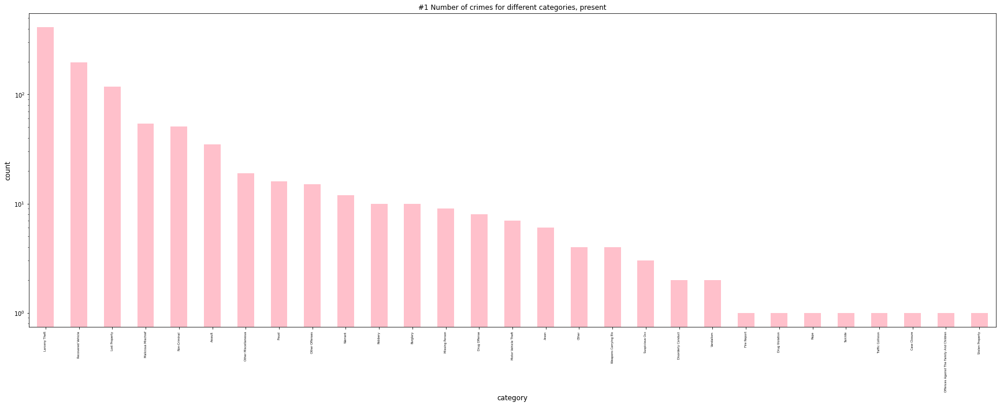

<Figure size 2160x720 with 0 Axes>

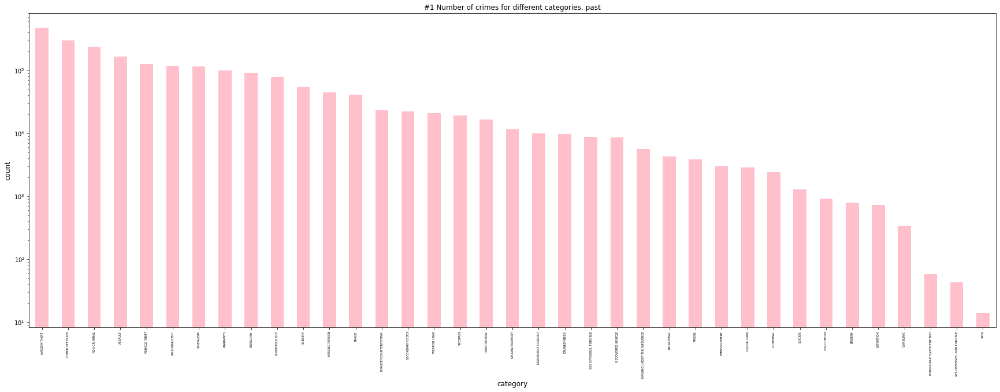

In [0]:
plt.figure()
ax1 = crimes_pd_df1.plot(kind = 'bar',x = 'incident_category',y = 'Count',logy= True,color = 'pink',legend = False, align = 'center')
ax1.set_ylabel('count',fontsize = 12)
ax1.set_xlabel('category',fontsize = 12)
plt.xticks(fontsize=5, rotation=90)
plt.title('#1 Number of crimes for different categories, present')
display()

plt.figure()
ax2 = crimes_pd_df2.plot(kind = 'bar',x = 'Category',y = 'Count',logy= True,color = 'pink',legend = False, align = 'center')
ax2.set_ylabel('count',fontsize = 12)
ax2.set_xlabel('category',fontsize = 12)
plt.xticks(fontsize=5, rotation=90)
plt.title('#1 Number of crimes for different categories, past')
display()

There are much more Larceny/Theft crimes than other types of crimes in both the present and the past, which is reasonable. Also, some categories of crimes, such as vandalism, is less prevalent in the more recent data than the historic data, which could more or less shows a decreasing trend of those kind of crimes. It would be interesting to study how they might vary in time.

What about different districts?

In [0]:
district_sql_1 = spark.sql("SELECT police_district, COUNT(*) AS Count FROM sf_crime_present GROUP BY 1 ORDER BY 2 DESC")
display(district_sql_1) # present
district_sql_2 = spark.sql("SELECT PdDistrict, COUNT(*) AS Count FROM sf_crime_past GROUP BY 1 ORDER BY 2 DESC")
display(district_sql_2) # past

police_district,Count
Out of SF,352
Central,163
Southern,101
Mission,82
Richmond,79
Northern,59
Park,57
Taraval,43
Bayview,35
Ingleside,20


PdDistrict,Count
SOUTHERN,390692
MISSION,288985
NORTHERN,266435
CENTRAL,221923
BAYVIEW,205480
TENDERLOIN,186954
INGLESIDE,181092
TARAVAL,155461
PARK,119698
RICHMOND,112804


<Figure size 2160x720 with 0 Axes>

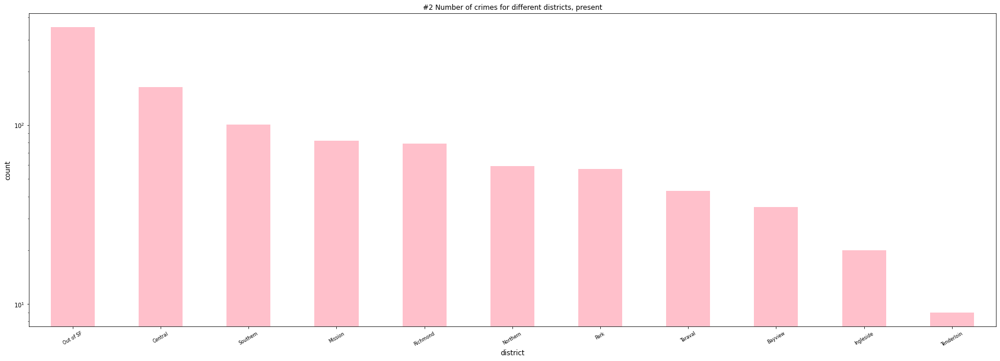

<Figure size 2160x720 with 0 Axes>

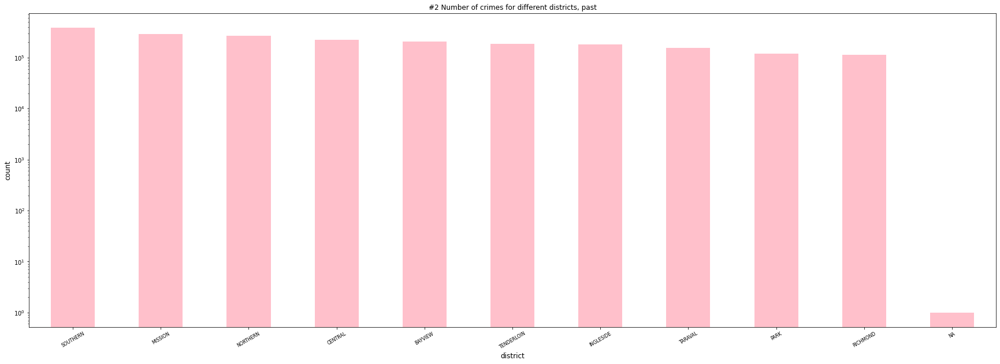

In [0]:
crimes_dis_pd_df = district_sql_1.toPandas()
plt.figure()

ax = crimes_dis_pd_df.plot(kind = 'bar',x='police_district',y = 'Count',logy= True,color = 'pink',legend = False, align = 'center')
ax.set_ylabel('count',fontsize = 12)
ax.set_xlabel('district',fontsize = 12)
plt.xticks(fontsize=8, rotation=30)
plt.title('#2 Number of crimes for different districts, present')
display()

crimes_dis_pd_df = district_sql_2.toPandas()
plt.figure()

ax = crimes_dis_pd_df.plot(kind = 'bar',x='PdDistrict',y = 'Count',logy= True,color = 'pink',legend = False, align = 'center')
ax.set_ylabel('count',fontsize = 12)
ax.set_xlabel('district',fontsize = 12)
plt.xticks(fontsize=8, rotation=30)
plt.title('#2 Number of crimes for different districts, past')
display()

Crimes in areas like southern SF looks like decreasing in count, and in areas like central SF may be increasing. It would be interesting to see how that changes in time as well.

From the news, a lot of crimes happen in downtown SF. How does the actual number of crimes in downtown compared to the rest?
I used the latitude and longtitude range for downtown SF: X (-122.4213,-122.4313), Y(37.7540,37.7740)

In [0]:
dt_result1 = spark.sql("""
                      with dt_crime as(
                      select substring(incident_datetime,6,5) as Date,
                             incident_year as Year
                      from sf_crime_present
                      where (-122.433671 < longitude
                             and longitude < -122.402497
                             and 37.753510 < latitude
                             and latitude < 37.782137)
                             )
                             
                      select Year, Date, COUNT(*) as Count
                      from dt_crime
                      group by Year, Date
                      order by Year, Date
                      """)
display(dt_result1) #present, downtown

ndt_result1 = spark.sql("""
                      with ndt_crime as(
                      select substring(incident_datetime,6,5) as Date,
                             incident_year as Year
                      from sf_crime_present
                      where (-122.433671 > longitude
                             or longitude > -122.402497
                             or 37.753510 > latitude
                             or latitude > 37.782137)
                             )
                             
                      select Year, Date, COUNT(*) as Count
                      from ndt_crime
                      group by Year, Date
                      order by Year, Date
                      """)
display(ndt_result1) #present, not downtown

Year,Date,Count
2019,06-11,1
2021,07-07,1
2021,07-22,1
2021,08-01,1
2021,08-04,1
2021,08-20,1
2021,09-21,1
2021,09-30,1
2021,10-21,1
2021,10-23,1


Year,Date,Count
2020,11-29,1
2021,06-04,1
2021,06-05,1
2021,06-08,1
2021,06-24,1
2021,07-01,1
2021,07-03,1
2021,07-07,1
2021,07-08,1
2021,07-09,1


In [0]:
dt_result2 = spark.sql("""
                      with dt_crime as(
                      select substring(Date,1,5) as Date,
                             substring(Date,7) as Year
                      from sf_crime_past
                      where (-122.423671 < X
                             and X < 122.412497
                             and 37.773510 < Y
                             and Y < 37.782137)
                             )
                             
                      select Year, Date, COUNT(*) as Count
                      from dt_crime
                      group by Year, Date
                      order by Year, Date
                      """)
display(dt_result2) #past, downtown

ndt_result2 = spark.sql("""
                      with ndt_crime as(
                      select substring(Date,1,5) as Date,
                             substring(Date,7) as Year
                      from sf_crime_past
                      where (-122.423671 > X
                             or X > 122.412497
                             or 37.773510 > Y
                             or Y > 37.782137)
                             )
                             
                      select Year, Date, COUNT(*) as Count
                      from ndt_crime
                      group by Year, Date
                      order by Year, Date
                      """)
display(ndt_result2) #past, not downtown

Year,Date,Count
2003,01/01,79
2003,01/02,43
2003,01/03,60
2003,01/04,33
2003,01/05,28
2003,01/06,41
2003,01/07,55
2003,01/08,69
2003,01/09,63
2003,01/10,44


Year,Date,Count
2003,01/01,503
2003,01/02,341
2003,01/03,358
2003,01/04,295
2003,01/05,339
2003,01/06,348
2003,01/07,344
2003,01/08,443
2003,01/09,339
2003,01/10,333


It appears that the news may give a false impression. For the past data, the number of crimes downtown is approximately the same as the number of crimes not downtown, while for the more recent data, there are way more crimes not downtown than downtow.

Now I would like to see how the number of crimes vary by month, for the recent data, to see if it has been improving recently.

In [0]:
crime_by_month_1 = spark.sql("""
                       SELECT substring(incident_datetime,6,2) as Month,
                             incident_year as Year, COUNT(*) AS Count
                       FROM sf_crime_present
                       GROUP BY Year, Month
                       HAVING Year in (2018,2019,2020,2021,2022,2023) 
                       ORDER BY Year, Month
                       """)
display(crime_by_month_1) #present

Month,Year,Count
01,2018,9
02,2018,6
03,2018,7
04,2018,6
05,2018,10
06,2018,10
07,2018,9
08,2018,8
09,2018,5
10,2018,3


Databricks visualization. Run in Databricks to view.

The recent data here does not seem to be complete, give that the number of crimes in 2018-2020 is so low compared to 2021 and 2022. Therefore, I would like to check the count from 2015 to 2018 in the past data as a comparison.

In [0]:
crime_by_month_2 = spark.sql("""
                      with Monthly_crime as(
                      select Date,
                             substring(Date,7) as Year,
                             substring(Date,1,2) as Month
                      from sf_crime_past
                      )
                      
                      select Year, Month, COUNT(*) as Count
                      from Monthly_crime
                      group by Year, Month
                      order by Year, Month
                      """)
display(crime_by_month_2) #past

Year,Month,Count
2003,01,12366
2003,02,11377
2003,03,12400
2003,04,12251
2003,05,12041
2003,06,11451
2003,07,11889
2003,08,12390
2003,09,12213
2003,10,12475


Databricks visualization. Run in Databricks to view.

The trend does not seem to vary much during those years, yet the trend within the years may be slightly similar to each other, which means there is possibly a seasonal trend. There may not be a significant trend here. Then what about times within a day? I selected a regular month and checked how it changes during different years.

In [0]:
# for may 16th
hour_result1 = spark.sql("""
                      select substring(incident_time,1,2) as Hour,
                      count(*) as Count
                      from sf_crime_present
                      where incident_datetime like '%-03-%'
                      group by Hour
                      order by Hour
                      """)
display(hour_result1) #present

Hour,Count
00,3
02,1
03,1
04,1
05,2
06,1
07,3
08,4
09,5
10,7


Databricks visualization. Run in Databricks to view.

In [0]:
hour_result2 = spark.sql("""
                      select substring(Time,1,2) as Hour,
                      count(*) as Count
                      from sf_crime_past
                      where Date like '03/%'
                      group by Hour
                      order by Hour
                      """)
display(hour_result2) #past

Hour,Count
00,9550
01,5520
02,4562
03,3238
04,2162
05,1810
06,2835
07,4879
08,7060
09,7665


Databricks visualization. Run in Databricks to view.

The present dataset shows that there is the least crimes during early morning and late afternoon/evening times, the past dataset suggests early morning times mostly, and perhaps after dinner night time. Both together it suggests that not to travel to to the day time if you want to reduce risk of being evolved in a crime, slightly counterintuitive as we might think it is more dangerous during the night.

Then which crimes happen the most during the night and which crimes happen more during the day? I used the most dangerous 3 districts to check it.

In [0]:
# most dangerous districts
dang_district1 = spark.sql( """
                             SELECT police_district, COUNT(*) as Count
                             FROM sf_crime_present
                             GROUP BY 1
                             ORDER BY 2 DESC
                             LIMIT 3 
                             """ )
display(dang_district1) #present

police_district,Count
Out of SF,352
Central,163
Southern,101


In [0]:
dang_district2 = spark.sql( """
                             SELECT PdDistrict, COUNT(*) as Count
                             FROM sf_crime_past
                             GROUP BY 1
                             ORDER BY 2 DESC
                             LIMIT 3 
                             """ )
display(dang_district2) #past

PdDistrict,Count
SOUTHERN,390692
MISSION,288985
NORTHERN,266435


In [0]:
crime_time1 = spark.sql( """
                             SELECT incident_category as category,
                             substring(incident_time,1,2) as Time,
                             count(*) as count
                             FROM sf_crime_present
                             where police_district in (SELECT police_district
                             FROM (SELECT police_district, COUNT(*) as Count
                             FROM sf_crime_present
                             GROUP BY 1
                             ORDER BY 2 DESC
                             LIMIT 3)
                             ) and incident_category is not null
                             GROUP BY category, Time
                             ORDER BY category, Time
                             
                             
                             """ )
display(crime_time1) #present

category,Time,count
Arson,20,1
Arson,21,1
Assault,10,1
Assault,11,1
Assault,12,1
Assault,14,1
Assault,15,1
Assault,18,2
Assault,19,1
Assault,21,2


Databricks visualization. Run in Databricks to view.

In [0]:
from pyspark.sql.functions import to_timestamp, hour
# add new columns to convert Time to hour format
df_opt2 = df_opt2.withColumn('IncidentTime', to_timestamp(df_opt2['Time'],'HH:mm')) 
# extract hour from incident time
df_opt2 = df_opt2.withColumn('Hour',hour(df_opt2['IncidentTime']))
crime_time2 = df_opt2.filter(df_opt2.PdDistrict.isin('SOUTHERN', 'MISSION', 'NORTHERN')).groupby('Category','Hour').count().orderBy('Category','Hour')

display(crime_time2) #past

Category,Hour,count
ARSON,0,84
ARSON,1,77
ARSON,2,84
ARSON,3,95
ARSON,4,74
ARSON,5,60
ARSON,6,50
ARSON,7,28
ARSON,8,34
ARSON,9,28


Databricks visualization. Run in Databricks to view.

The result for both the present and the past shows that Larcent and Theft happen the most during the afternoon, or day time in general. Consider it being the most common crime, that is perhaps why the data suggest it may be safer at night. For some more offensive crimes, for example, sex offences, it is more common at night time, from 10pm to 12am, than other times during the day. This may suggest that violent crimes may be more common during the night. I would explore assault and sex offences to see if it is true.

In [0]:
# only use the past data since the present is too small
violent_crime_time2 = crime_time2.filter(crime_time2.Category.isin('ASSAULT', 'SEX OFFENSES, FORCIBLE', 'SEX OFFENSES, NON FORCIBLE'))

display(violent_crime_time2) #past

Category,Hour,count
ASSAULT,0,4120
ASSAULT,1,3940
ASSAULT,2,3510
ASSAULT,3,1622
ASSAULT,4,1017
ASSAULT,5,772
ASSAULT,6,1089
ASSAULT,7,1581
ASSAULT,8,2325
ASSAULT,9,2629


Databricks visualization. Run in Databricks to view.

These violent categories may decrease less rapidly during 2am to 3am, which in a way proves that the worry about the night being dangerous is still valid.

But how much are the crimes resolved for the crimes? Is there a large difference between the different categories?

In [0]:
res_num1 = spark.sql("""select incident_category, resolution, count(*) as N_res from sf_crime_present group by incident_category, resolution""")
res_num1.createOrReplaceTempView("res_num1")

cate_num1 = spark.sql("""select incident_category, count(*) as N_cate from sf_crime_present group by incident_category""")
cate_num1.createOrReplaceTempView("cate_num1")

resol_1 = spark.sql("""
                      select distinct res_num1.incident_category, res_num1.resolution, N_res/N_cate as Percentage
                      from res_num1 left join cate_num1 on res_num1.incident_category = cate_num1.incident_category
                      order by incident_category, resolution""")
display(resol_1) #present

incident_category,resolution,Percentage
Arson,Open or Active,1.0
Assault,Cite or Arrest Adult,0.2
Assault,Open or Active,0.8
Burglary,Cite or Arrest Adult,0.1
Burglary,Open or Active,0.9
Case Closure,Exceptional Adult,1.0
Disorderly Conduct,Cite or Arrest Adult,0.5
Disorderly Conduct,Open or Active,0.5
Drug Offense,Cite or Arrest Adult,0.875
Drug Offense,Open or Active,0.125


Databricks visualization. Run in Databricks to view.

In [0]:
res_num2 = spark.sql("""select category, resolution, count(*) as N_res from sf_crime_past group by category, resolution""")
res_num2.createOrReplaceTempView("res_num2")

cate_num2 = spark.sql("""select category, count(*) as N_cate from sf_crime_past group by category""")
cate_num2.createOrReplaceTempView("cate_num2")

resol_2 = spark.sql("""
                      select distinct res_num2.category, res_num2.resolution, N_res/N_cate as Percentage
                      from res_num2 left join cate_num2 on res_num2.category = cate_num2.category
                      order by category, resolution""")
display(resol_2) #past

category,resolution,Percentage
ARSON,"ARREST, BOOKED",0.1625806451612903
ARSON,"ARREST, CITED",0.004387096774193549
ARSON,COMPLAINANT REFUSES TO PROSECUTE,7.741935483870968E-4
ARSON,EXCEPTIONAL CLEARANCE,5.161290322580645E-4
ARSON,NONE,0.8190967741935484
ARSON,NOT PROSECUTED,7.741935483870968E-4
ARSON,PROSECUTED BY OUTSIDE AGENCY,7.741935483870968E-4
ARSON,PROSECUTED FOR LESSER OFFENSE,2.5806451612903227E-4
ARSON,PSYCHOPATHIC CASE,0.004387096774193549
ARSON,UNFOUNDED,0.0064516129032258064


Databricks visualization. Run in Databricks to view.

From the results above, it looks like light crime, like stolen property, trespass, liquor laws, as well as crimes that identify the suspects, like warrants, weapon laws and DUI, are more commonly resolved than other cases. It looks like to me the key is to be able to correctly identify the suspect to resolve the cases. Perhaps policies like adding securities to residential and commercial areas can help resolve the cases more quickly.

Does resolution of the cases depend on the district too?

In [0]:
res_num3 = spark.sql("""select police_district, 
                              resolution, count(*) as N_res
                             from sf_crime_present 
                             group by police_district, resolution
                             order by police_district, resolution
                             """)
res_num3.createOrReplaceTempView("res_num3")

cate_num3 = spark.sql("""select police_district, count(*) as N_cate from sf_crime_present group by police_district""")
cate_num3.createOrReplaceTempView("cate_num3")

display(res_num3)
display(cate_num3)

resol_3 = spark.sql("""
                    select distinct res_num3.police_district, 
                    res_num3.resolution, 
                    N_res/N_cate as Percentage
                    from res_num3 left join cate_num3 on res_num3.police_district = cate_num3.police_district
                    order by police_district, resolution""")
display(resol_3) #present


police_district,resolution,N_res
Bayview,Cite or Arrest Adult,1
Bayview,Open or Active,34
Central,Cite or Arrest Adult,1
Central,Open or Active,162
Ingleside,Open or Active,20
Mission,Cite or Arrest Adult,3
Mission,Open or Active,79
Northern,Cite or Arrest Adult,3
Northern,Open or Active,56
Out of SF,Cite or Arrest Adult,45


Databricks visualization. Run in Databricks to view.

police_district,N_cate
Taraval,43
Ingleside,20
Southern,101
Northern,59
Bayview,35
Mission,82
Central,163
Tenderloin,9
Park,57
Out of SF,352


police_district,resolution,Percentage
Bayview,Cite or Arrest Adult,0.02857142857142857
Bayview,Open or Active,0.9714285714285714
Central,Cite or Arrest Adult,0.006134969325153374
Central,Open or Active,0.9938650306748467
Ingleside,Open or Active,1.0
Mission,Cite or Arrest Adult,0.036585365853658534
Mission,Open or Active,0.9634146341463414
Northern,Cite or Arrest Adult,0.05084745762711865
Northern,Open or Active,0.9491525423728814
Out of SF,Cite or Arrest Adult,0.1278409090909091


In [0]:
res_num4 = spark.sql("""select PDdistrict, 
                              resolution, count(*) as N_res
                             from sf_crime_past 
                             group by PDdistrict, resolution
                             order by PDdistrict, resolution
                             """)
res_num4.createOrReplaceTempView("res_num4")

cate_num4 = spark.sql("""select PDdistrict, count(*) as N_cate from sf_crime_past group by PDdistrict""")
cate_num4.createOrReplaceTempView("cate_num4")

resol_4 = spark.sql("""
                    select distinct res_num4.PDdistrict, res_num4.resolution, N_res/N_cate as Percentage
                    from res_num4 left join cate_num4 on res_num4.PDdistrict = cate_num4.PDdistrict
                    order by PDdistrict, resolution""")
display(resol_4) #present

PDdistrict,resolution,Percentage
BAYVIEW,"ARREST, BOOKED",0.23202744792680552
BAYVIEW,"ARREST, CITED",0.09409188242164687
BAYVIEW,COMPLAINANT REFUSES TO PROSECUTE,0.006443449484134709
BAYVIEW,DISTRICT ATTORNEY REFUSES TO PROSECUTE,0.005411718902082928
BAYVIEW,EXCEPTIONAL CLEARANCE,0.0015135292972552072
BAYVIEW,LOCATED,0.013904029589254428
BAYVIEW,NONE,0.623729803387191
BAYVIEW,NOT PROSECUTED,0.0027934592174420868
BAYVIEW,PROSECUTED BY OUTSIDE AGENCY,0.0018493284017909286
BAYVIEW,PROSECUTED FOR LESSER OFFENSE,6.813315164492895E-5


Databricks visualization. Run in Databricks to view.

The Bayview distric thas a higher rate capturing the criminals at all times of the data; Taraval looks like it has one of the lowest percentage on arresting the criminals (out of SF/ na excluded). Perhaps officers can learn from the Bayview district to learn more about working effectively

### Result from Exploratory Data Analysis

The most imporant finding about the data is that a good proportion of the data since 2018 is missing, a lot of dates have no crime data history, which is impossible for a city like San Francisco. From the data, there does not seem to be a significant change in the number of crimes during the years, but there might be a seasonal pattern within each year, and also within each day. On the other hand, the crime activity also depends on the category of the crime. Violent crimes may have a different distribution during the day than less violent crimes, and they may also take much longer time to be resolved.

To understand the dataset more, I will build unsupervised learning models to study the geographical relationships and time series models to study the general trend using the data from 2003 to 2018.

### Clustering using Spark ML

In [0]:

# for clustering
data_all = df_opt2


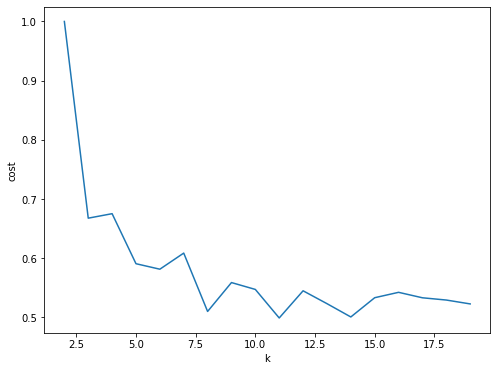

In [0]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml.feature import VectorAssembler
# Loads data.
data_all = data_all.select(['IncidntNum','X','Y'])
#Prepare features
FEATURES_COL = ['X', 'Y']
for col in data_all.columns:
    if col in FEATURES_COL:
        data_all = data_all.withColumn(col,data_all[col].cast('float'))
vecAssembler = VectorAssembler(inputCols=FEATURES_COL, outputCol="features")
df_kmeans = vecAssembler.transform(data_all).select('IncidntNum', 'features')

#Optimize choice of k
cost = np.zeros(20)
for k in range(2,20):
    kmeans = KMeans().setK(k).setSeed(1).setFeaturesCol("features")
    model = kmeans.fit(df_kmeans.sample(False,0.1, seed=42))
    predictions = model.transform(df_kmeans.sample(False,0.1, seed=42))
    evaluator = ClusteringEvaluator()
    silhouette = evaluator.evaluate(predictions)
    cost[k] = silhouette
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(2,20),cost[2:20])
ax.set_xlabel('k')
ax.set_ylabel('cost')
display()

It seems that the best case is a 10-means model to cluster the data.

### Time series analysis

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
from dateutil.relativedelta import relativedelta
import seaborn as sns
import statsmodels.api as sm  
from statsmodels.tsa.stattools import acf  
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

from pylab import rcParams

import statsmodels.api as sm
from numpy.random import normal, seed
from scipy.stats import norm
from statsmodels.tsa.arima_model import ARMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.arima_model import ARIMA
import math
from sklearn.metrics import mean_squared_error

from plotly import tools

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.figure_factory as ff

In [0]:
from pyspark.sql.functions import hour, date_format, to_date, month, year

# Preprocessing
df_opt2.createOrReplaceTempView("sf_crime_past_all")
data_train = spark.sql("""
                      select *
                      from sf_crime_past_all
                      where substring(Date,7) < 2016
    
                      """)

data_valid = spark.sql("""
                      select *
                      from sf_crime_past_all
                      where substring(Date,7) >= 2016
                      """)

data_train = data_train.withColumn("IncidentDate",to_date(df_opt2.Date, "MM/dd/yyyy")) 
data_train = data_train.groupBy("IncidentDate").count().orderBy("IncidentDate")
display(data_train)

data_valid = data_valid.withColumn("IncidentDate",to_date(df_opt2.Date, "MM/dd/yyyy")) 
data_valid = data_valid.groupBy("IncidentDate").count().orderBy("IncidentDate")
display(data_valid)

IncidentDate,count
2003-01-01,582
2003-01-02,384
2003-01-03,418
2003-01-04,328
2003-01-05,367
2003-01-06,389
2003-01-07,399
2003-01-08,512
2003-01-09,402
2003-01-10,377


Databricks visualization. Run in Databricks to view.

IncidentDate,count
2016-01-01,543
2016-01-02,387
2016-01-03,304
2016-01-04,353
2016-01-05,367
2016-01-06,350
2016-01-07,418
2016-01-08,432
2016-01-09,396
2016-01-10,388


IncidentDate,count
2003-01-01,582
2003-01-02,384
2003-01-03,418
2003-01-04,328
2003-01-05,367
2003-01-06,389
2003-01-07,399
2003-01-08,512
2003-01-09,402
2003-01-10,377


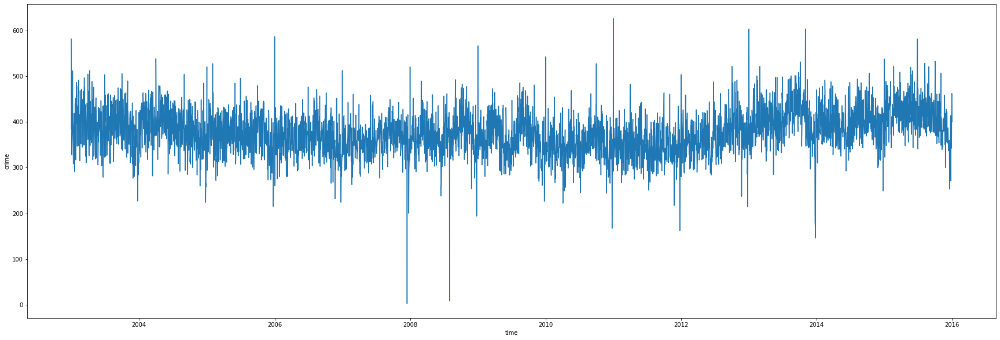

In [0]:
crime_train = data_train.toPandas()
plt.xlabel('time')
plt.ylabel('crime')
plt.plot('IncidentDate', 'count', data=crime_train)
display(crime_train)

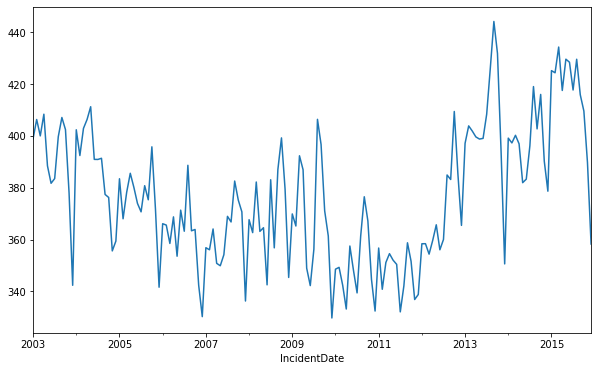

In [0]:
crime_train = crime_train.set_index(crime_train['IncidentDate'])
crime_train.index = pd.to_datetime(crime_train.index)
y = crime_train['count'].resample('MS').mean()
y.plot(figsize=(10, 6))
plt.show() # possible seasonal trends

In [0]:
display(y.describe())

count    156.000000
mean     376.862685
std       25.883069
min      329.709677
25%      356.758065
50%      375.279570
75%      397.168203
max      444.166667
Name: count, dtype: float64

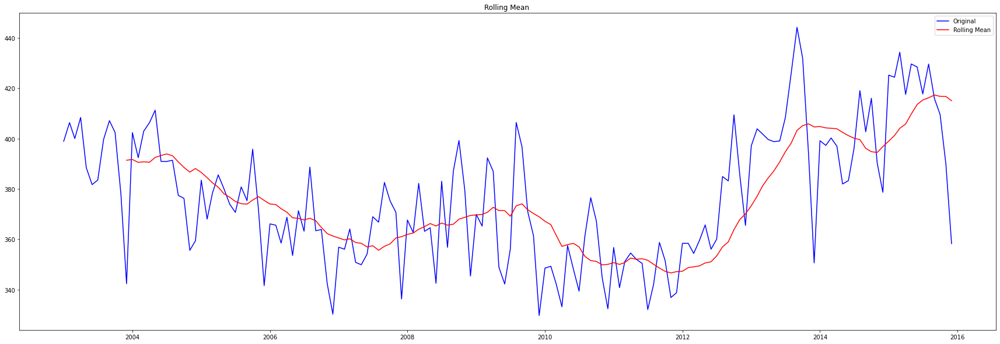

In [0]:
rollingmean = y.rolling(window=12).mean()
rollingstd = y.rolling(window=12).std()

orig = plt.plot(y, color='blue', label='Original')
mean = plt.plot(rollingmean , color='red', label='Rolling Mean')
#std = plt.plot(rollingstd, color='black', label='Rolling Std')
plt.rcParams["figure.figsize"] = (30,9)

plt.legend(loc='best')
plt.title('Rolling Mean ')
plt.show(block=False)

# the mean looks changing over time, which suggests possible trend

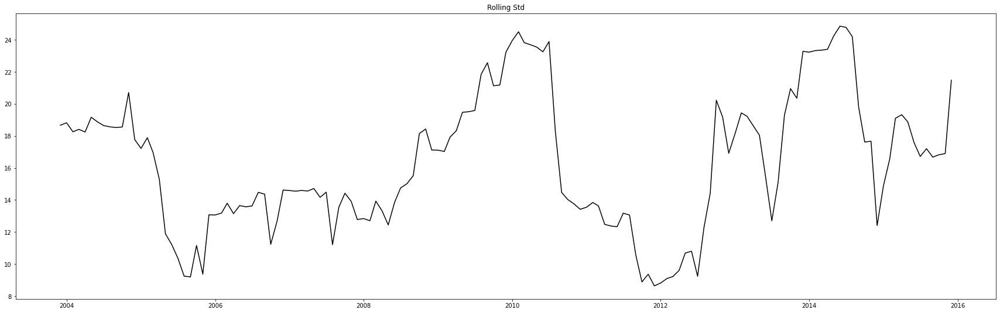

In [0]:
std = plt.plot(rollingstd, color='black', label='Rolling Std')
plt.title('Rolling Std')
plt.show(block=False)

# the rolling std is relatively more stable, which suggests possible stationarity

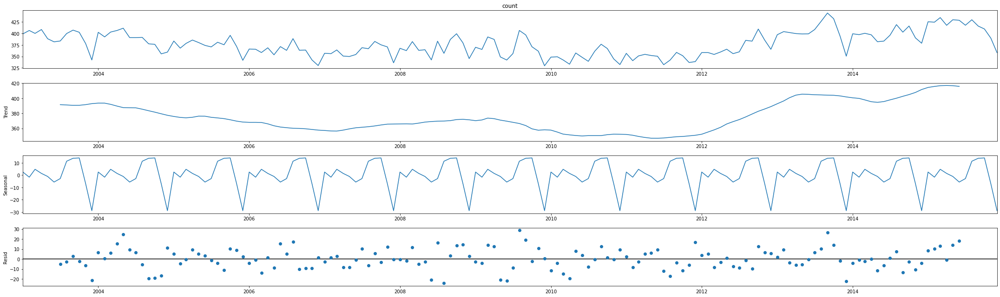

In [0]:
deco = sm.tsa.seasonal_decompose(y, model='additive')
fig = deco.plot()
plt.rcParams["figure.figsize"] = (30,10)

plt.show()

# the decomposition shows strong seasonal component and possible trend over the years. The residual looks stationary

In [0]:
deco.resid.describe()

Out[154]: count    144.000000
mean       0.117812
std       10.424242
min      -24.238287
25%       -6.247017
50%       -0.565691
75%        6.972286
max       28.660816
Name: resid, dtype: float64

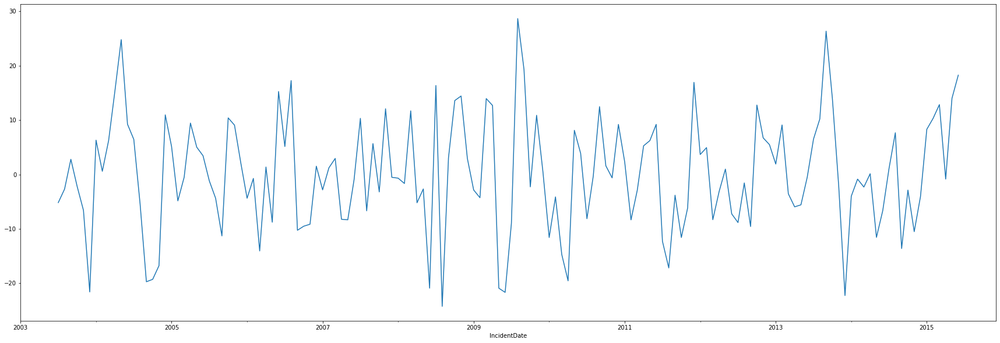

In [0]:
fig = deco.resid.plot()
plt.show()
# residual looks quite stationary

In [0]:
display(deco.resid.isnull().sum())

12

In [0]:
Residual = deco.resid
Residual = Residual.fillna(Residual.bfill())
Residual = Residual.fillna(Residual.ffill())
ADFresult = adfuller(Residual)
print('ADF Statistic: %f' % ADFresult[0])
print('p-value: %f' % ADFresult[1])
print('Critical Values:')
for key, value in ADFresult[4].items():
	print('\t%s: %.3f' % (key, value))
    
# so stationary. Try ARIMA model first

ADF Statistic: -8.695219
p-value: 0.000000
Critical Values:
	1%: -3.473
	5%: -2.880
	10%: -2.577


Out[158]: [<matplotlib.lines.Line2D at 0x7f0887ab6400>]

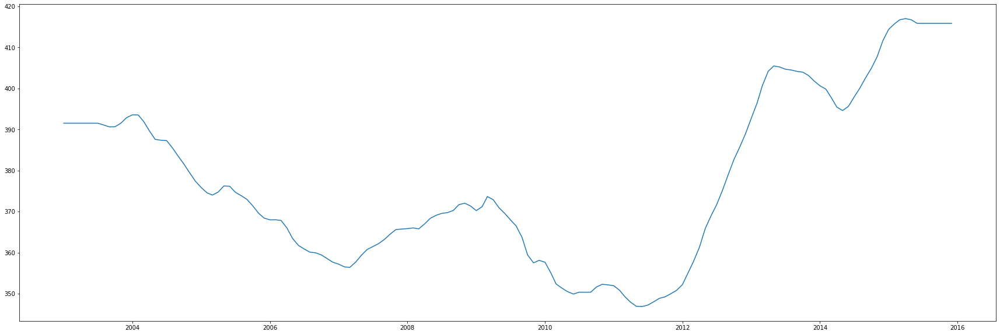

In [0]:
crimeTrend = deco.trend
crimeTrend = crimeTrend.fillna(crimeTrend.bfill())
crimeTrend = crimeTrend.fillna(crimeTrend.ffill())
plt.plot(crimeTrend , label='crime trend')

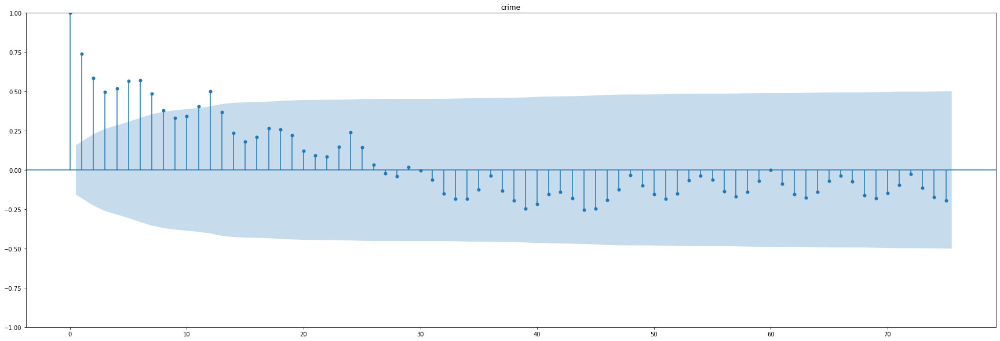

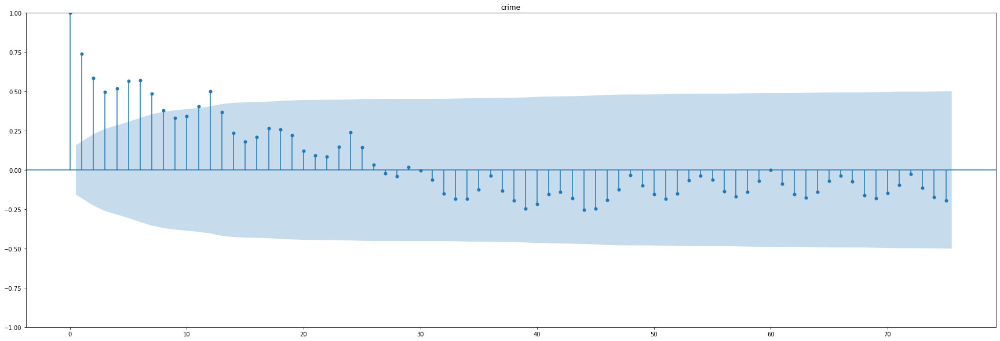

In [0]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#plot_acf(Residual,title="crime")
plot_acf(y,lags=75,title="crime")

/databricks/python/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



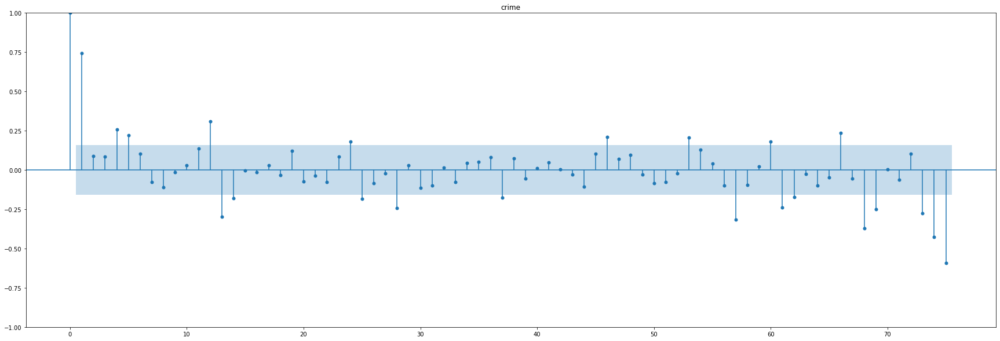

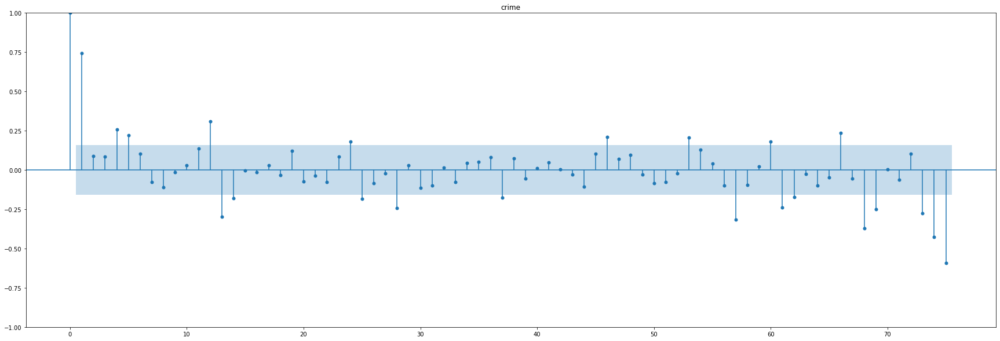

In [0]:
plot_pacf(y,lags=75,title="crime")

The ACF looks expentially decaying and the PACF looks like cutting off after lag 1 or possibly decaying as well, therefore, a AR(1) model or an ARIMA(1,1) model could possibly be a good fit for the data.

/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



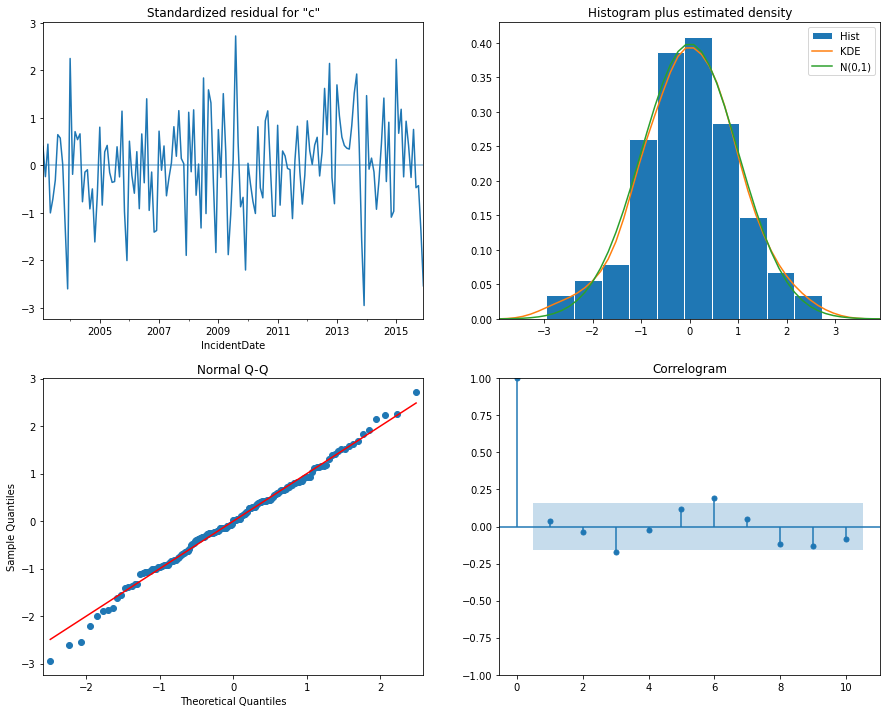

In [0]:
mod1 = sm.tsa.statespace.SARIMAX(y, order=(1, 1, 1))

TSresults1 = mod1.fit()

TSresults1.plot_diagnostics(figsize=(15, 12))
plt.show()


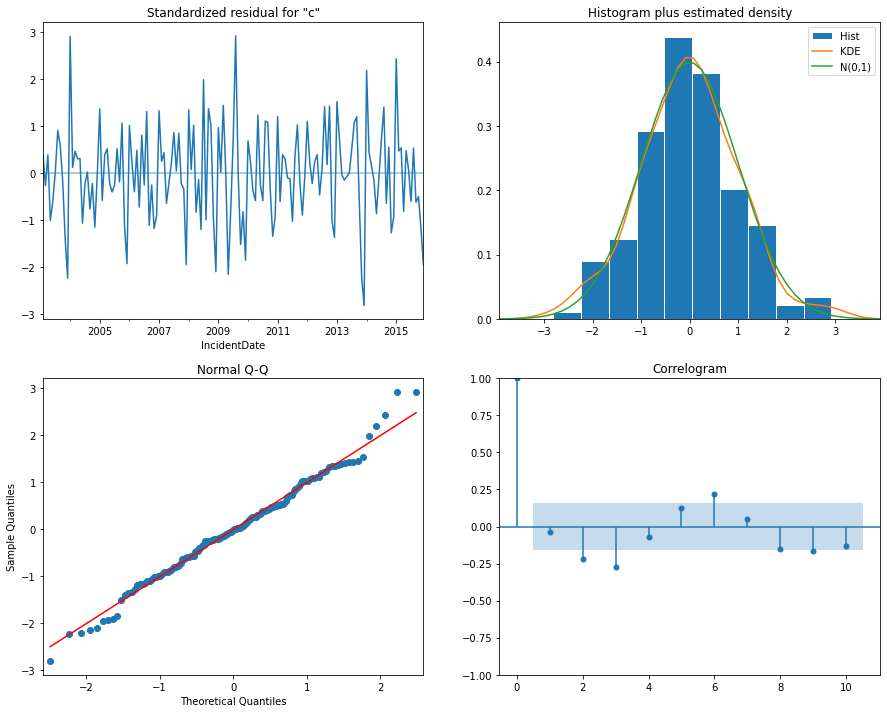

In [0]:
mod2 = sm.tsa.statespace.SARIMAX(y, order=(1, 1, 0))

TSresults2 = mod2.fit()

TSresults2.plot_diagnostics(figsize=(15, 12))
plt.show()

Both Models look plausible, but the ARIMA(1,1,1) model seems much better with more normally distributed residuals, and the ACF plot also not correlated as much after lag 1, which follows the assumption more closely.

What about a smoothing based model? I'm using Holt-Winters model here.

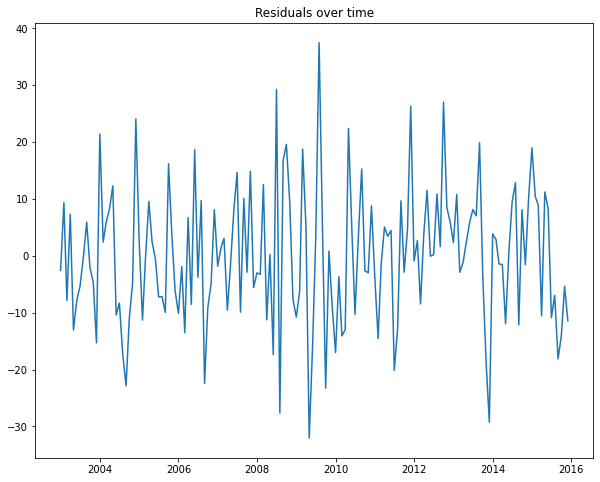

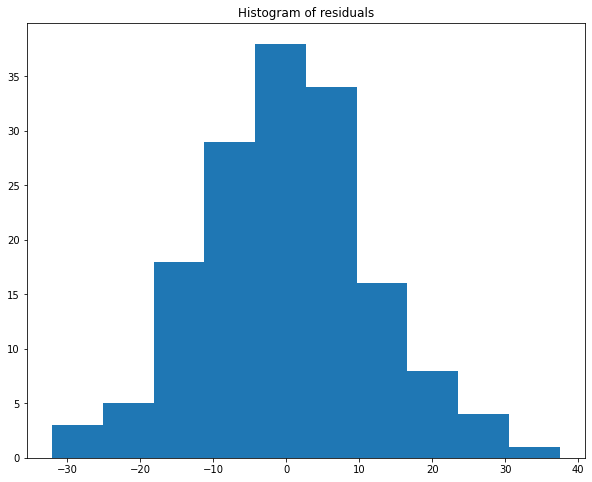

/databricks/python/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



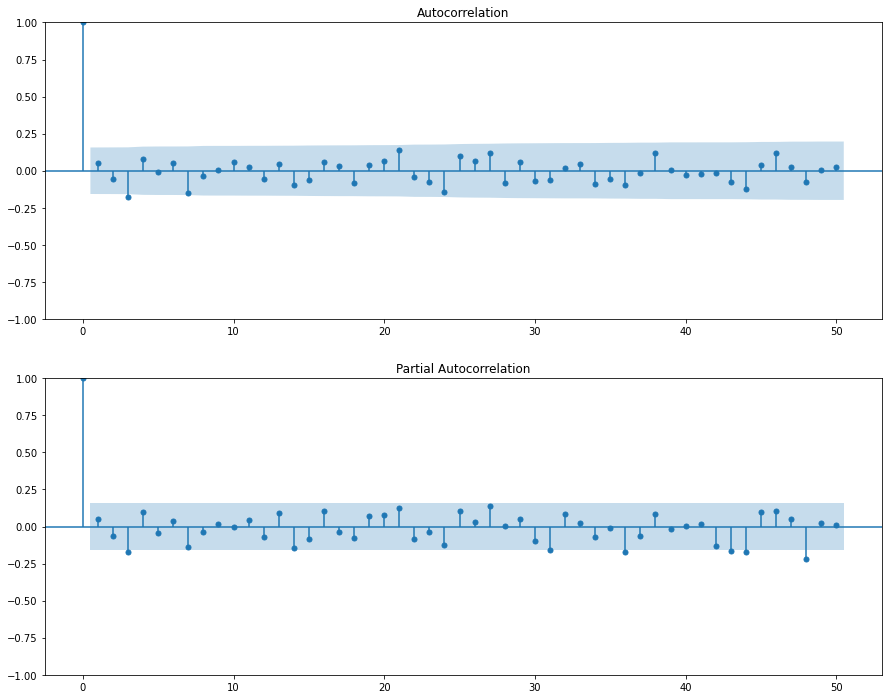

In [0]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
mod_HW = ExponentialSmoothing(y, seasonal='additive', seasonal_periods=12)
mod_HW_fit = mod_HW.fit()

residuals = pd.DataFrame(mod_HW_fit.resid)

# Residuals over time
plt.figure(figsize=(10, 8))
plt.title('Residuals over time')
plt.plot(residuals)
plt.show()

# Histogram of residuals
plt.figure(figsize=(10, 8))
plt.title('Histogram of residuals')
plt.hist(residuals)
plt.show()

# ACF and PACF plots of the residuals
fig, ax = plt.subplots(2,1,figsize=(15, 12))
fig = sm.graphics.tsa.plot_acf(residuals, lags=50, ax=ax[0])
fig = sm.graphics.tsa.plot_pacf(residuals, lags=50, ax=ax[1])
plt.show()
plt.show()

The residuals from the Holt-Winters model seem slightly less normal than the residuals from the ARIMA model

How do they predict the future?

In [0]:
data_train = data_train.toPandas()
data_valid = data_valid.toPandas()

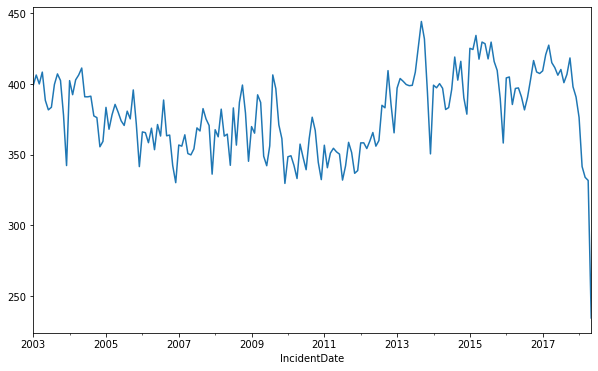

In [0]:
data_total = pd.concat([data_train,data_valid])

data_total = data_total.set_index(data_total['IncidentDate'])
data_total.index = pd.to_datetime(data_total.index)
y_tot = data_total['count'].resample('MS').mean()
y_tot.plot(figsize=(10, 6))
plt.show()

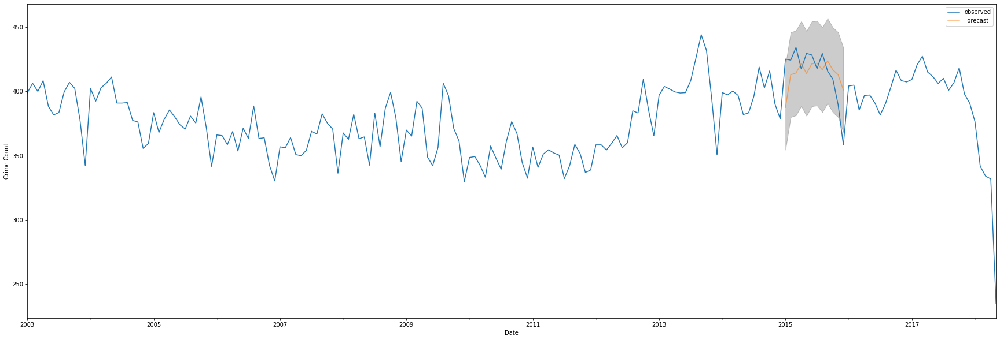

In [0]:
pred_ARIMA = TSresults1.get_prediction(start=pd.to_datetime('2015-01-01'), dynamic=False)
pred_ci_ARIMA = pred_ARIMA.conf_int()

ax = y_tot['1990':].plot(label='observed')
pred_ARIMA.predicted_mean.plot(ax=ax, label='Prediction', alpha=.6)

y_tot.index = pd.to_datetime(y_tot.index)
pred_ARIMA.predicted_mean.index = pd.to_datetime(pred_ARIMA.predicted_mean.index)

ax.fill_between(pred_ci_ARIMA.index, pred_ci_ARIMA.iloc[:, 0], pred_ci_ARIMA.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Crime Count')
plt.legend()

plt.show()


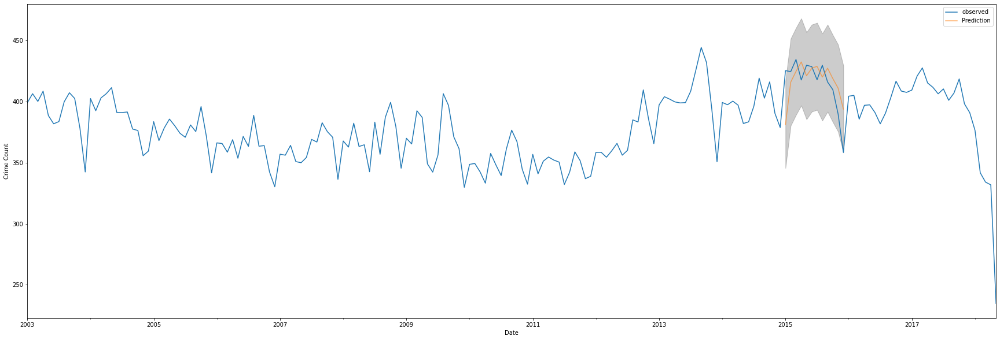

In [0]:
pred_ARIMA2 = TSresults2.get_prediction(start=pd.to_datetime('2015-01-01'), dynamic=False)
pred_ci_ARIMA2 = pred_ARIMA2.conf_int()

ax = y_tot['1990':].plot(label='observed')
pred_ARIMA2.predicted_mean.plot(ax=ax, label='Prediction', alpha=.6)

y_tot.index = pd.to_datetime(y_tot.index)
pred_ARIMA2.predicted_mean.index = pd.to_datetime(pred_ARIMA2.predicted_mean.index)

ax.fill_between(pred_ci_ARIMA2.index, pred_ci_ARIMA2.iloc[:, 0], pred_ci_ARIMA2.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Crime Count')
plt.legend()

plt.show()

In [0]:
pred_ARIMA.predicted_mean

Out[184]: IncidentDate
2015-01-01    387.556068
2015-02-01    412.979098
2015-03-01    414.377631
2015-04-01    421.631449
2015-05-01    413.934052
2015-06-01    421.441376
2015-07-01    422.020106
2015-08-01    416.834364
2015-09-01    423.802350
2015-10-01    416.797568
2015-11-01    413.035878
2015-12-01    401.060208
Freq: MS, Name: predicted_mean, dtype: float64

In [0]:
pred_ARIMA2.predicted_mean

Out[186]: IncidentDate
2015-01-01    380.991311
2015-02-01    415.769328
2015-03-01    424.526482
2015-04-01    432.279244
2015-05-01    420.925966
2015-06-01    427.167265
2015-07-01    428.672150
2015-08-01    419.880797
2015-09-01    427.177240
2015-10-01    418.643209
2015-11-01    410.853318
2015-12-01    393.725050
Freq: MS, Name: predicted_mean, dtype: float64

In [0]:
y_forecasted1 = pred_ARIMA.predicted_mean
y_forecasted2 = pred_ARIMA2.predicted_mean
y_truth = y['2015-01-01':]

# Compute the mean square error
mse1 = ((y_forecasted1 - y_truth) ** 2).mean()
mse2 = ((y_forecasted2 - y_truth) ** 2).mean()
print('The Mean Squared Error of the ARIMA (1,1,1) model prediction is {}'.format(round(mse1, 2)))
print('The Mean Squared Error of the ARIMA (1,1,0) model prediction is {}'.format(round(mse2, 2)))


The Mean Squared Error of the ARIMA (1,1,1) model prediction is 410.56
The Mean Squared Error of the ARIMA (1,1,0) model prediction is 378.93


Even though the residuals are not fitting well, the ARIMA (1,1,0) model seems to have a better prediction on the existing dataset than the ARIMA (1,1,1) model. How would they compare, together with the Holt-Winters model, in forecasting?

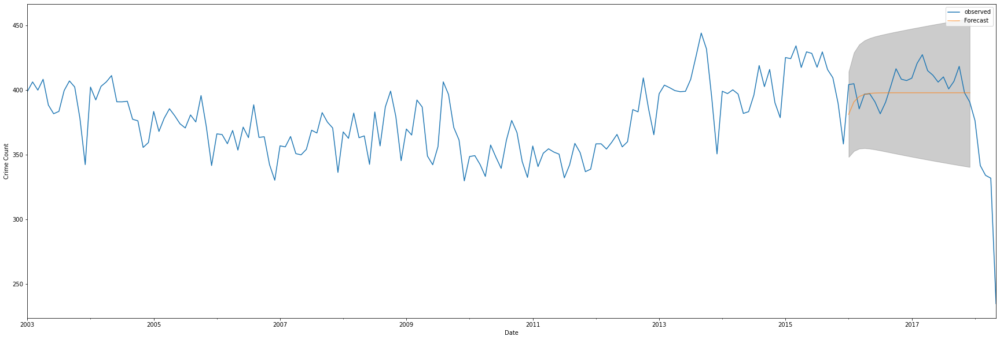

In [0]:
# 2 year forecast
forecast_ARIMA = TSresults1.get_forecast(steps=24)
forecast_ci_ARIMA = forecast_ARIMA.conf_int()

ax = y_tot['1990':].plot(label='observed')
forecast_ARIMA.predicted_mean.plot(ax=ax, label='Forecast', alpha=.6)

y_tot.index = pd.to_datetime(y_tot.index)
forecast_ARIMA.predicted_mean.index = pd.to_datetime(forecast_ARIMA.predicted_mean.index)

ax.fill_between(forecast_ci_ARIMA.index, forecast_ci_ARIMA.iloc[:, 0], forecast_ci_ARIMA.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Crime Count')
plt.legend()

plt.show()

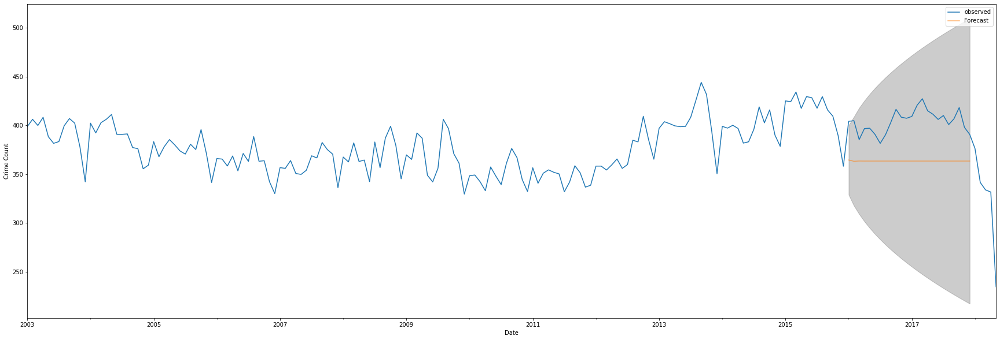

In [0]:
forecast_ARIMA2 = TSresults2.get_forecast(steps=24)
forecast_ci_ARIMA2 = forecast_ARIMA2.conf_int()

ax = y_tot['1990':].plot(label='observed')
forecast_ARIMA2.predicted_mean.plot(ax=ax, label='Forecast', alpha=.6)

y_tot.index = pd.to_datetime(y_tot.index)
forecast_ARIMA2.predicted_mean.index = pd.to_datetime(forecast_ARIMA2.predicted_mean.index)

ax.fill_between(forecast_ci_ARIMA2.index, forecast_ci_ARIMA2.iloc[:, 0], forecast_ci_ARIMA2.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('Crime Count')
plt.legend()

plt.show()

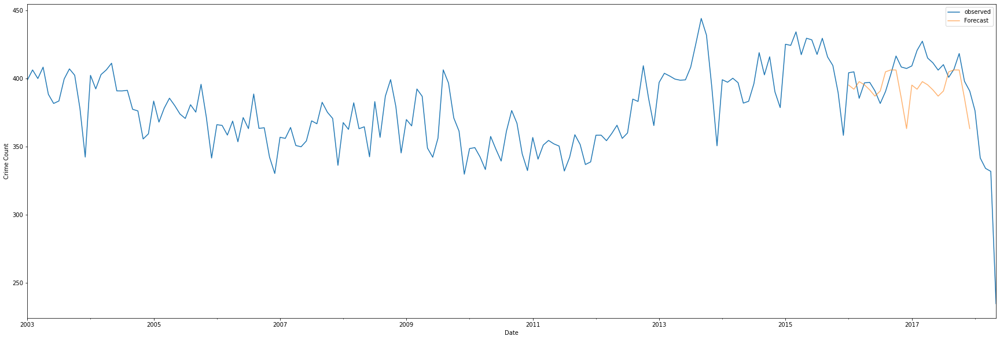

In [0]:
forecast_HW = mod_HW_fit.forecast(steps=24)

ax = y_tot['1990':].plot(label='observed')
forecast_HW.plot(ax=ax, label='Forecast', alpha=.6)

y_tot.index = pd.to_datetime(y_tot.index)
forecast_HW.index = pd.to_datetime(forecast_HW.index)

ax.set_xlabel('Date')
ax.set_ylabel('Crime Count')
plt.legend()

plt.show()

In [0]:
y_forecast1 = forecast_ARIMA.predicted_mean #ARIMA(1,1,1)
y_forecast2 = forecast_ARIMA2.predicted_mean #ARIMA(1,1,0)
y_forecast3 = forecast_HW #HW
y_truth = y_tot['2016-01-01':]

# Compute the mean square error
mse1 = ((y_forecast1 - y_truth) ** 2).mean()
mse2 = ((y_forecast2 - y_truth) ** 2).mean()
mse3 = ((y_forecast3 - y_truth) ** 2).mean()
print('The Mean Squared Error of the ARIMA (1,1,1) model forecast is {}'.format(round(mse1, 2)))
print('The Mean Squared Error of the ARIMA (1,1,0) model forecast is {}'.format(round(mse2, 2)))
print('The Mean Squared Error of the HW model forecast is {}'.format(round(mse3, 2)))

The Mean Squared Error of the ARIMA (1,1,1) model forecast is 188.36
The Mean Squared Error of the ARIMA (1,1,0) model forecast is 1780.05
The Mean Squared Error of the HW model forecast is 326.06


The Forecast using Holt Winters looks much more realistic than that of ARIMA models, but the MSE of the ARIMA(1,1,1) model is still better than then MSE of the HW model, even though it barely predicts the trend as the HW model. If we want to predict models a long time in the future, the HW model would be better, but the ARIMA(1,1,1) might work better for the near future. Both models suggest that the number of crimes might not decrease in the near future, but rather stay with the trend. The data after 2018 is not complete, and perhaps when the data is completed, a much refined model can be build similar to the models to forecast how crime numbers would evolve in the future, especially after COVID that might have changed the crime world significantly.